In [1]:
import omnipath as op
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pySankey import sankey as sn
import mellon as ml
import networkx as nx
from matplotlib.pyplot import figure
import glob
import netrd
import itertools
import random
random.seed(42)



c:\Users\melis\AppData\Local\Programs\Python\Python37\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path = glob.glob("processed_data/hot-encoded-diseases_*.csv")

for res in range(0,13):
    db = op.interactions.import_intercell_network(transmitter_params = {"categories":"ligand"}, receiver_params = {"categories": "receptor"})
    print(np.shape(db))
    db = db[np.logical_not(db['genesymbol_intercell_source'].str.startswith('HLA'))]
    db = db[np.logical_not(db['genesymbol_intercell_target'].str.startswith('HLA'))]
    db = db[~db['genesymbol_intercell_target'].astype(str).str.startswith('COMPLEX')]
    db = db[~db['genesymbol_intercell_source'].astype(str).str.startswith('COMPLEX')]
    print(np.shape(db))
    tgts_all = pd.read_csv(path[res])
    tgts_all['gene']=tgts_all['genes']
    tgts = tgts_all.drop(columns=['genes']).set_index(['gene'])

    source, percSrc, targets, percTgt, sum = ml.lr.find_hits(tgts, db)


    LRs = db[['genesymbol_intercell_source','genesymbol_intercell_target']][(db['genesymbol_intercell_source'].isin(list(sum.gene))) | (db['genesymbol_intercell_target'].isin(list(sum.gene)))]
    if res == 0:
        all_genes = np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target']))
        df = pd.DataFrame(pd.DataFrame(all_genes).isin(np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target'])))).rename(columns = {0:path[res].split('_')[2].split('.csv')[0]})
        df['genes'] = all_genes
        df.set_index('genes', inplace = True)
    else:
        df2 = pd.DataFrame(pd.DataFrame(all_genes).isin(np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target'])))).rename(columns = {0:path[res].split('_')[2].split('.csv')[0]})
        df2['genes'] = all_genes
        df2.set_index('genes', inplace = True)
        df = df.merge(df2, left_index = True, right_index = True, how = 'left')

(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)
(9708, 45)
(8345, 45)


(9708, 45)
(8345, 45)
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
FGF6      0.0
NID1      0.0
NLGN1     0.0
FAM3B     0.0
ZPBP2     0.0
Length: 352, dtype: float64


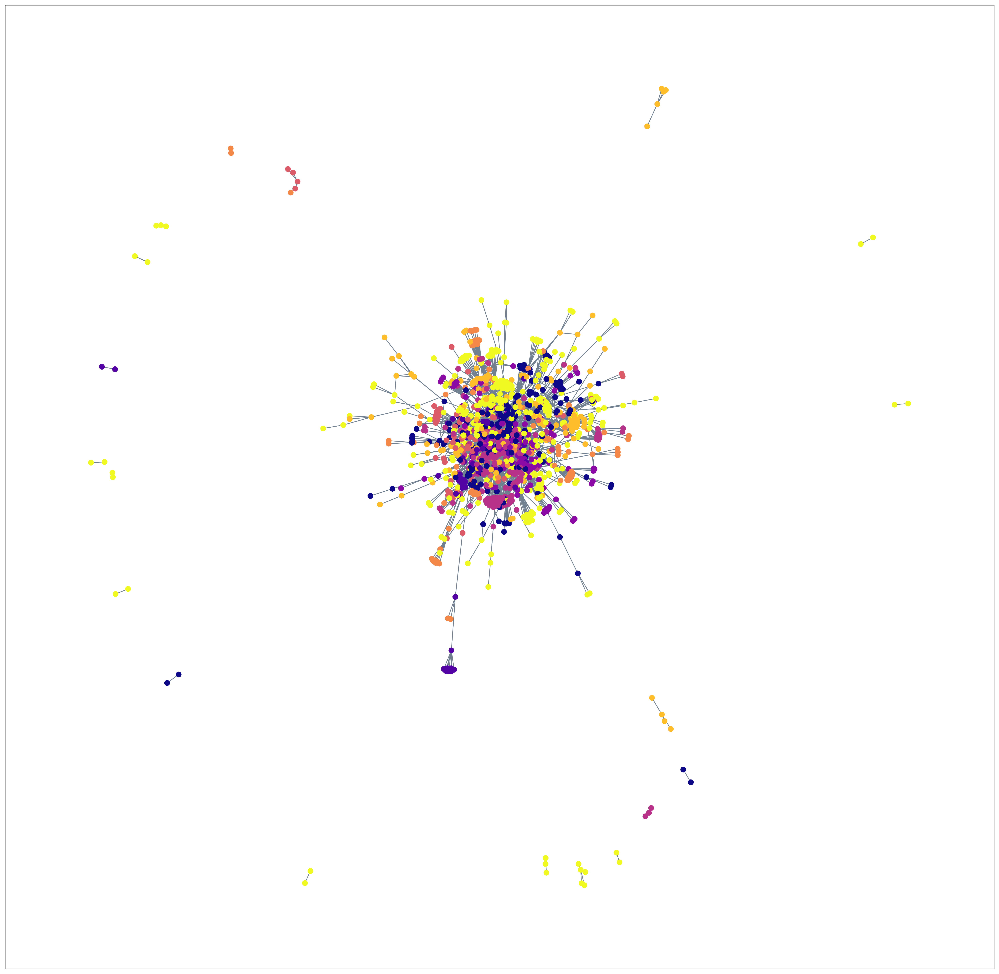

(9708, 45)
(8345, 45)
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
FGF23     0.0
NMB       0.0
ETV5      0.0
FAM3B     0.0
ZPBP2     0.0
Length: 311, dtype: float64


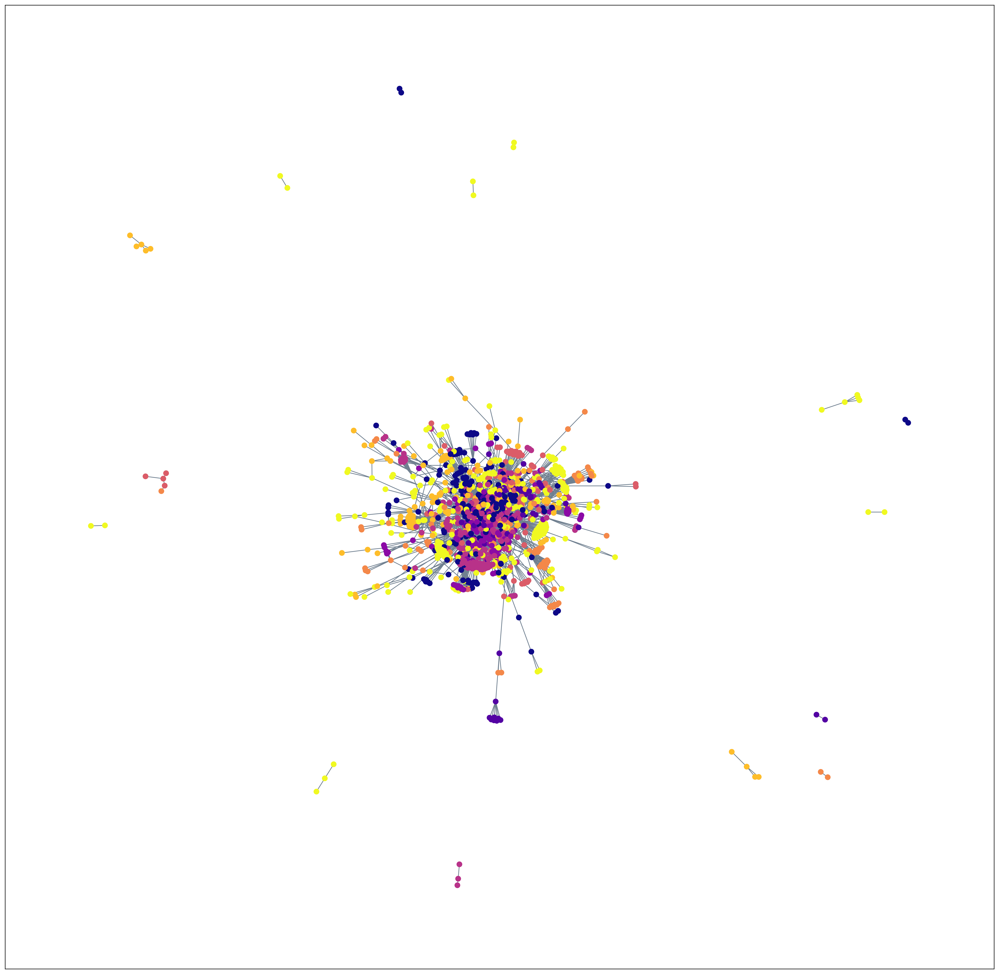

(9708, 45)
(8345, 45)
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
IL21      0.0
IL34      0.0
IL12B     0.0
IL12A     0.0
IFNK      0.0
Length: 281, dtype: float64


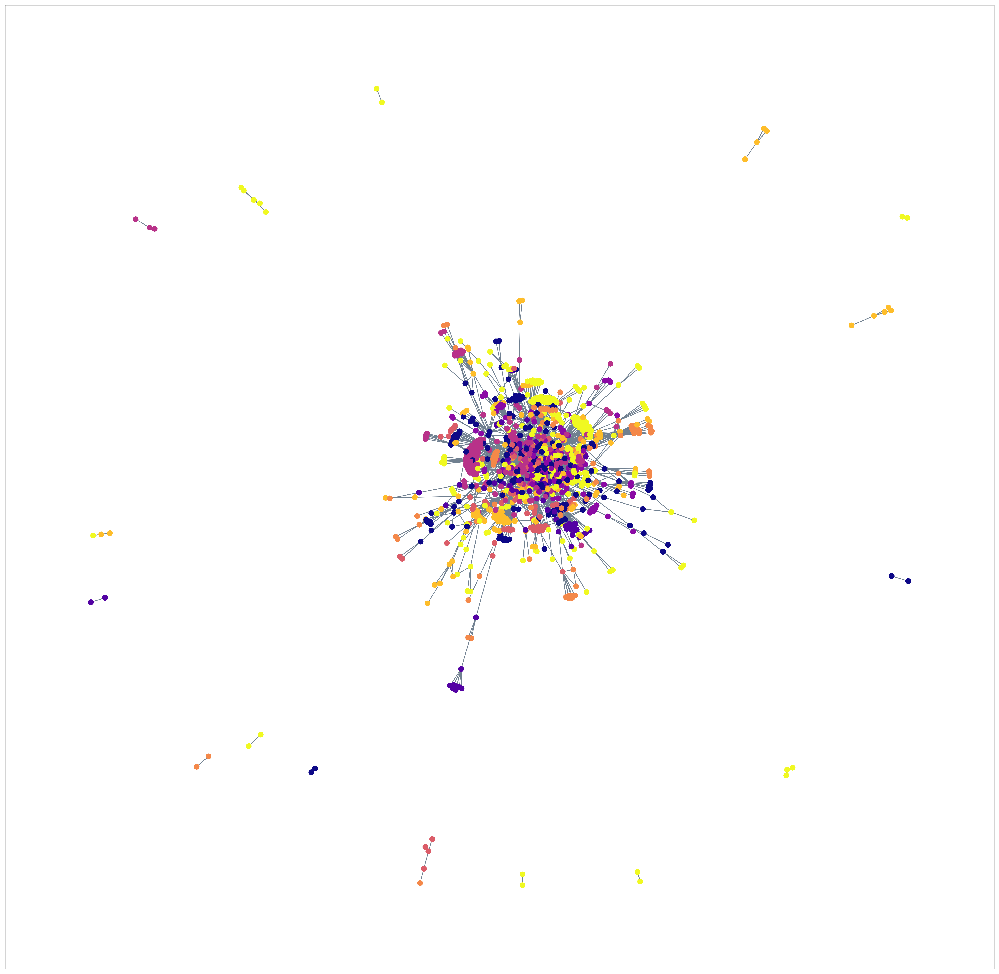

(9708, 45)
(8345, 45)
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
GAL       0.0
IL2       0.0
IL12A     0.0
IL12B     0.0
IFNK      0.0
Length: 257, dtype: float64


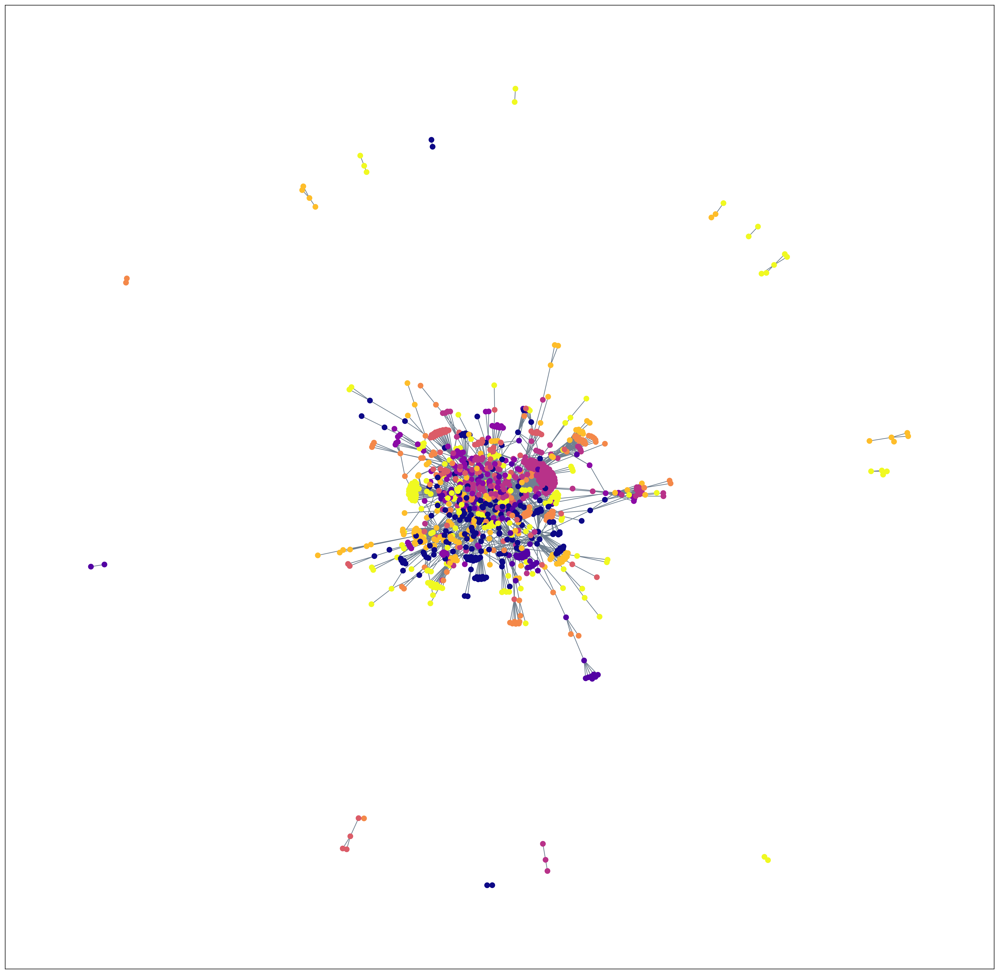

(9708, 45)
(8345, 45)
MAPK3    82.0
MAPK1    75.0
STAT3    66.0
CXCR4    51.0
CCR4     46.0
         ... 
FSTL5     0.0
GAL       0.0
IFNK      0.0
IL12A     0.0
IL12B     0.0
Length: 231, dtype: float64


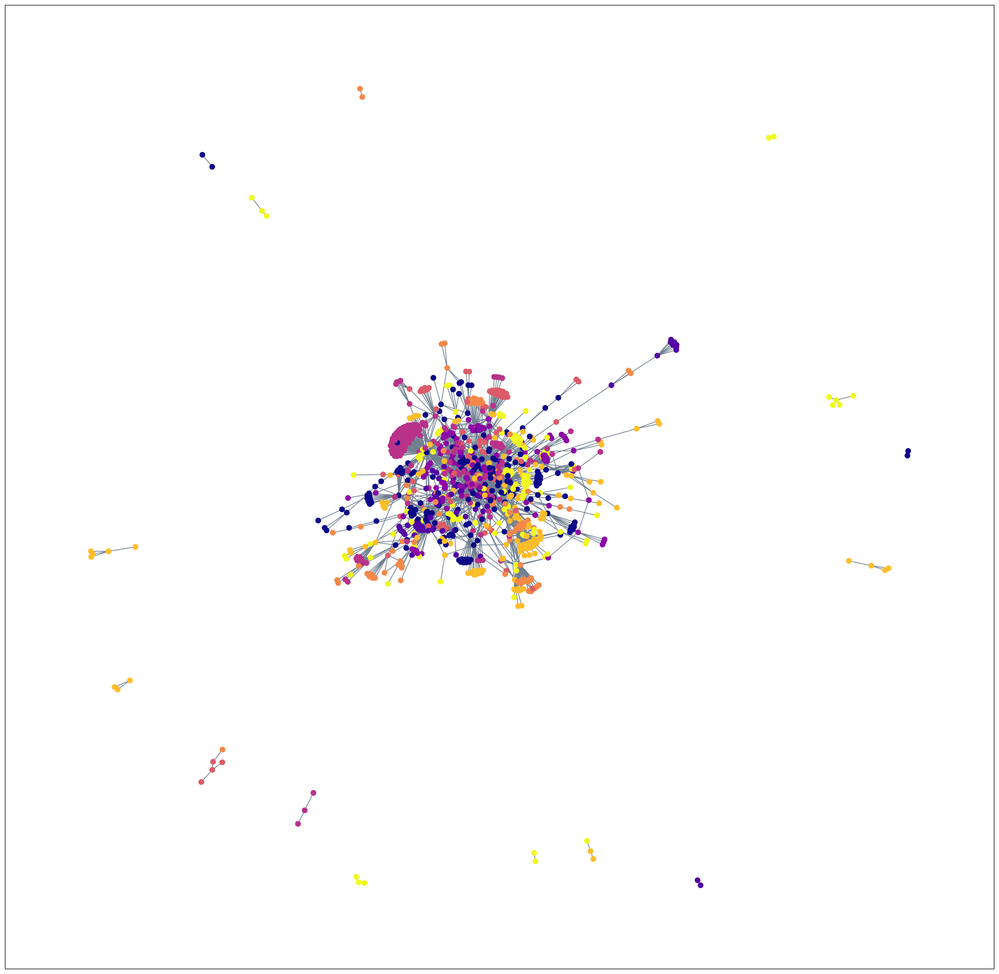

(9708, 45)
(8345, 45)
STAT3    66.0
CXCR4    51.0
CCR4     46.0
CXCR5    44.0
ITGB5    34.0
         ... 
EFNA5     0.0
NMB       0.0
NLGN1     0.0
NID1      0.0
NGF       0.0
Length: 201, dtype: float64


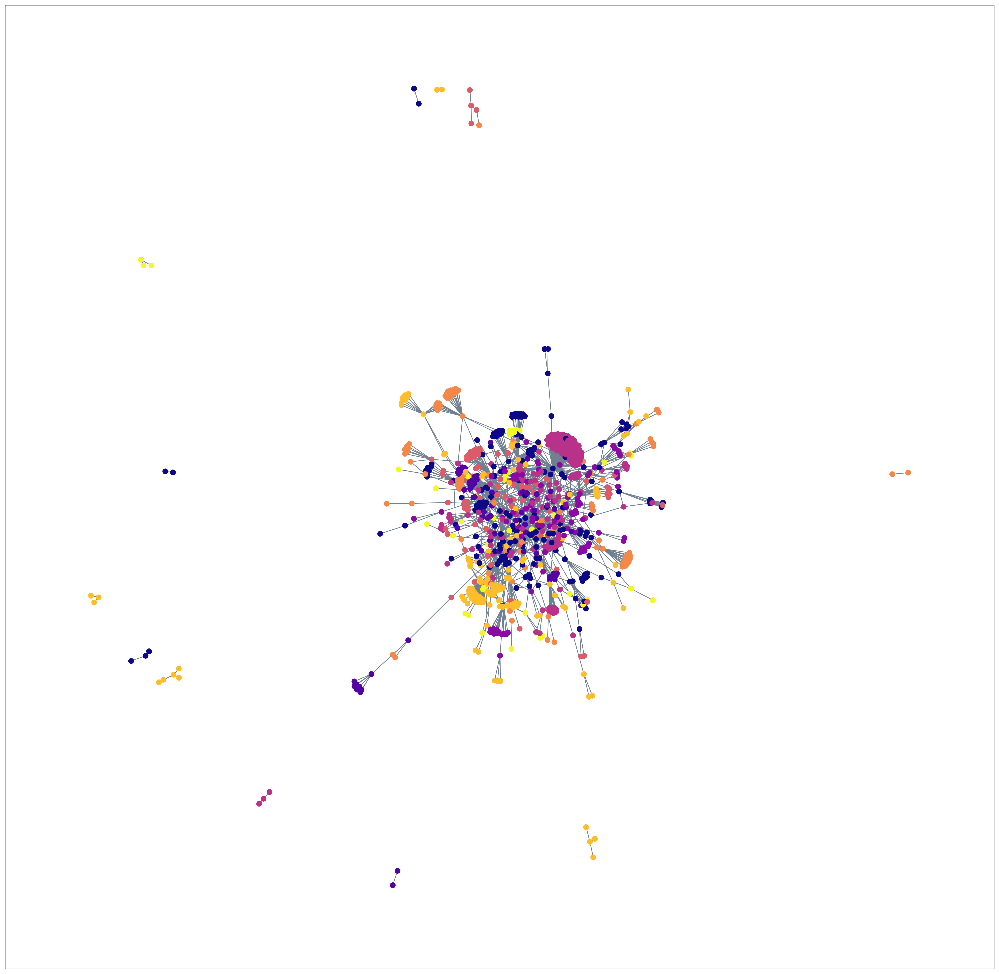

(9708, 45)
(8345, 45)
STAT3    66.0
CXCR4    51.0
ITGB5    34.0
ITGA9    30.0
ITGA8    25.0
         ... 
ETV5      0.0
NMB       0.0
NLGN1     0.0
NID1      0.0
NGF       0.0
Length: 175, dtype: float64


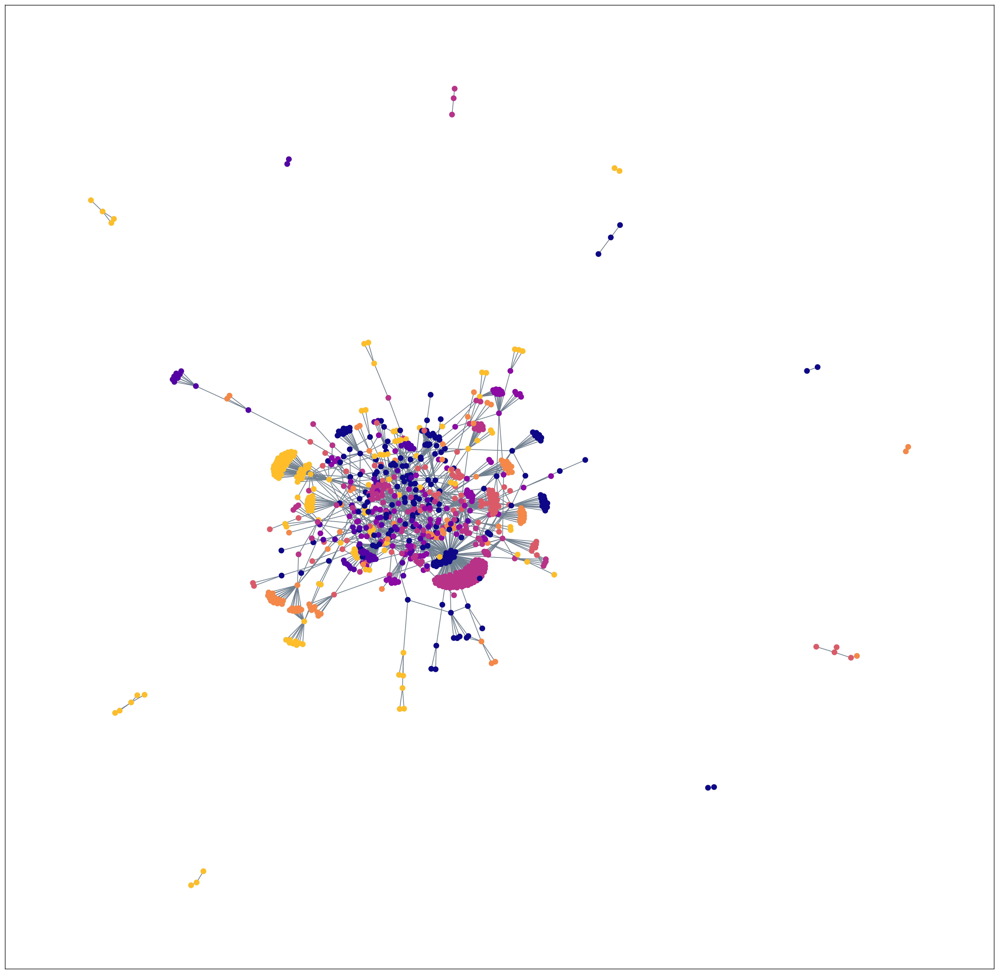

(9708, 45)
(8345, 45)
STAT3     66.0
ITGB5     34.0
ITGA8     25.0
BMPR1B    24.0
TLR4      19.0
          ... 
FSTL5      0.0
GAL        0.0
NGF        0.0
NLGN1      0.0
ETV5       0.0
Length: 137, dtype: float64


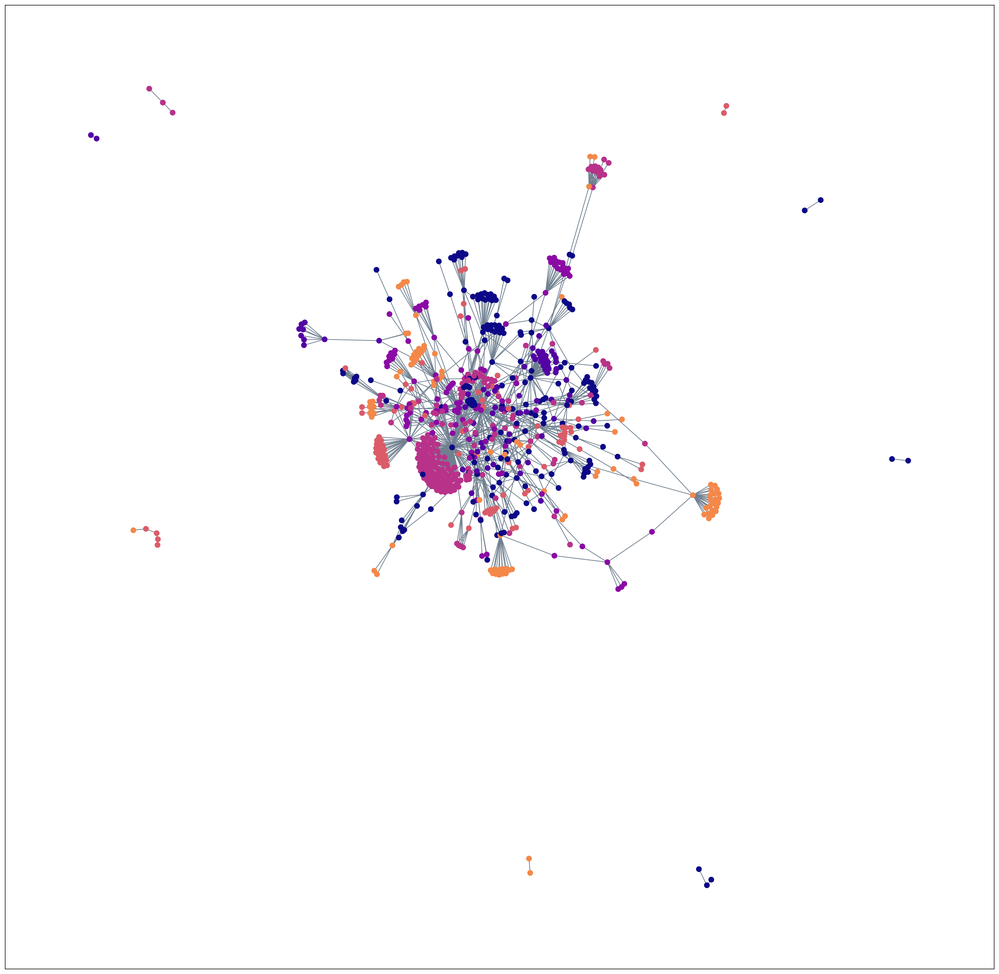

(9708, 45)
(8345, 45)
STAT3    66.0
ITGB5    34.0
ITGA8    25.0
NRP1     19.0
TLR4     19.0
         ... 
FSTL5     0.0
EFNA5     0.0
FGF20     0.0
FGF6      0.0
ETV5      0.0
Length: 111, dtype: float64


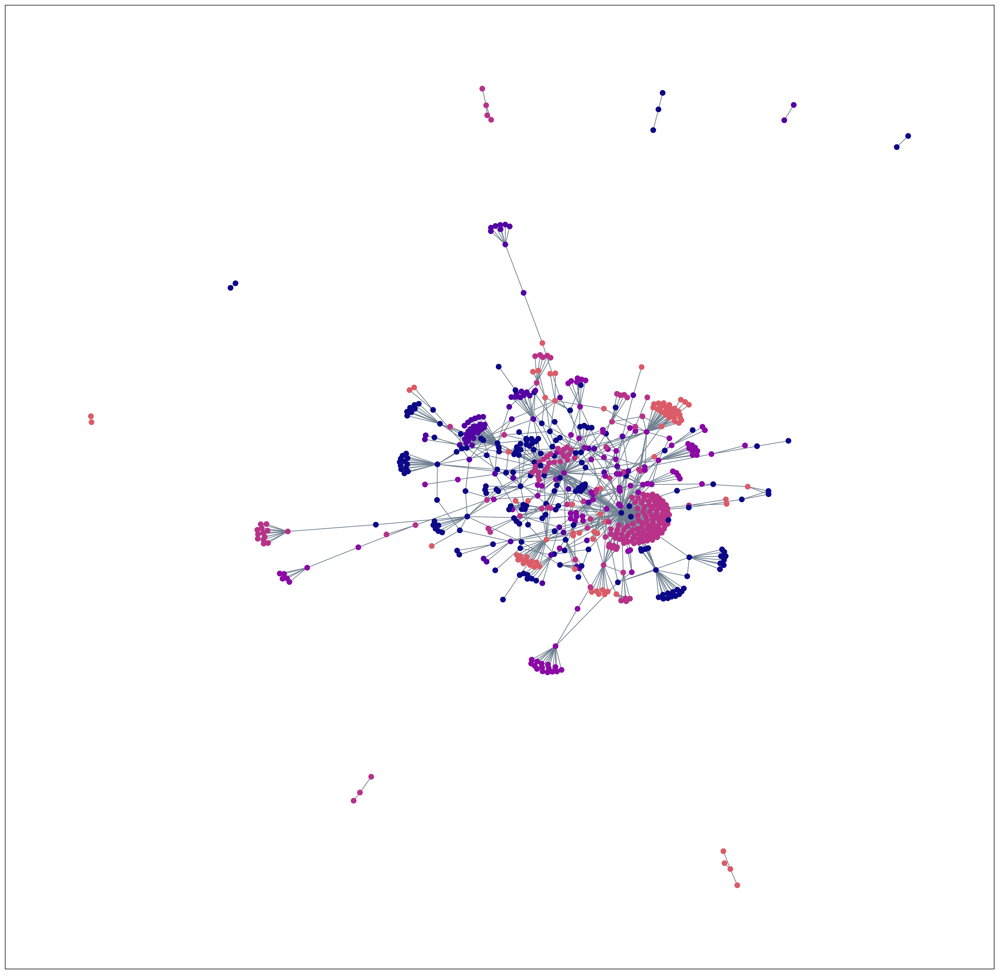

(9708, 45)
(8345, 45)
STAT3    66.0
ITGB5    34.0
ITGA8    25.0
TLR4     19.0
ERBB4    14.0
         ... 
CD58      0.0
MAPT      0.0
LRFN5     0.0
LGI1      0.0
IL12A     0.0
Length: 84, dtype: float64


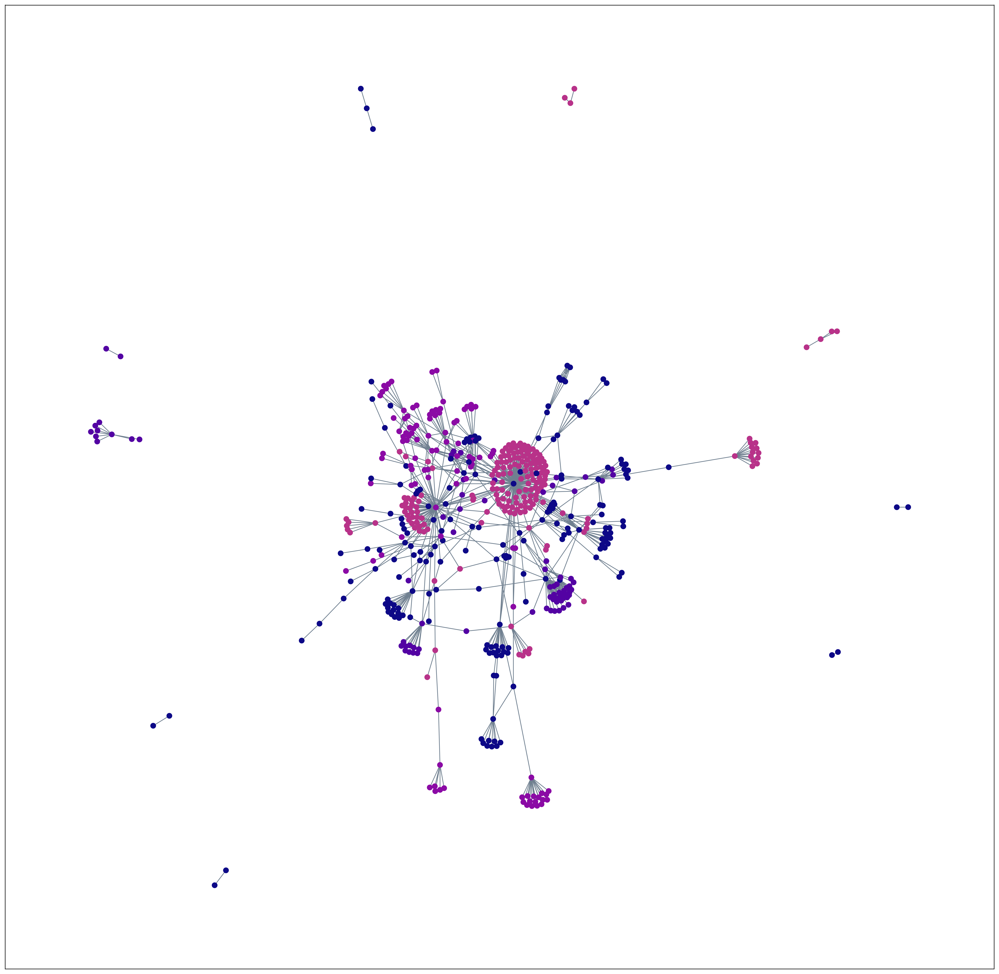

(9708, 45)
(8345, 45)
ITGB5    34.0
TLR4     19.0
ERBB4    14.0
APP      11.0
PRKD1    10.0
         ... 
LRFN5     0.0
MAPT      0.0
FSTL5     0.0
GAL       0.0
IL12A     0.0
Length: 70, dtype: float64


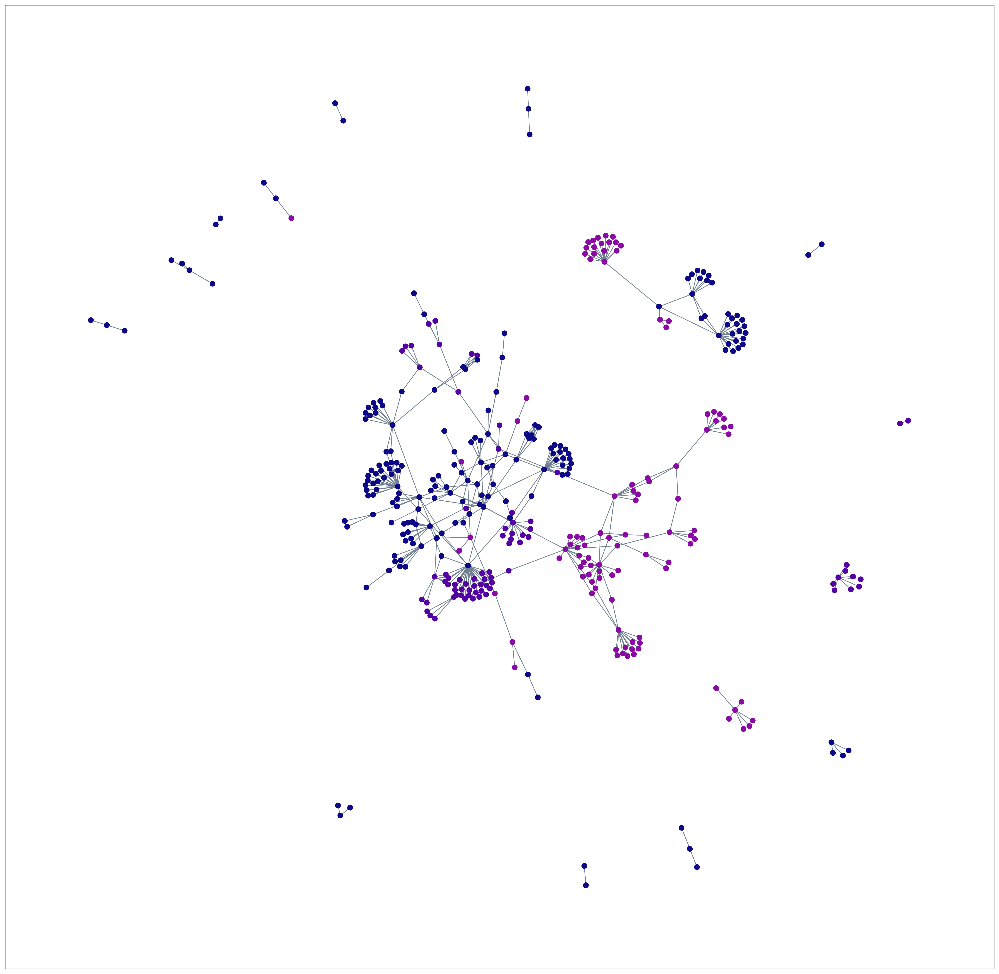

(9708, 45)
(8345, 45)
ITGB5      34.0
TLR4       19.0
ERBB4      14.0
APP        11.0
NOTCH3     10.0
PRKD1      10.0
NRXN1       8.0
DCC         8.0
CD47        8.0
GRIA1       7.0
SCN9A       5.0
ATM         5.0
INPP5D      4.0
PLCG2       4.0
PLA2G6      4.0
FES         4.0
GRIN2A      4.0
SCN1A       4.0
SCN2A       4.0
ESR2        2.0
TBK1        2.0
ACE         2.0
CHRNB2      2.0
STK39       2.0
CHRNA3      2.0
CHRNA2      2.0
CR1         2.0
NEGR1       2.0
LINGO1      1.0
PSEN1       1.0
SRPK2       1.0
CILK1       1.0
TUBA4A      1.0
UNC5C       1.0
ATP2A2      1.0
VRK2        1.0
AKT3        1.0
ADCY2       1.0
CNTNAP2     1.0
GRM5        1.0
RTN4R       1.0
RELN        0.0
SEMA6D      0.0
SNCA        0.0
SORL1       0.0
ANG         0.0
APOE        0.0
CNTN4       0.0
LGI1        0.0
LRFN5       0.0
MAPT        0.0
GAL         0.0
dtype: float64


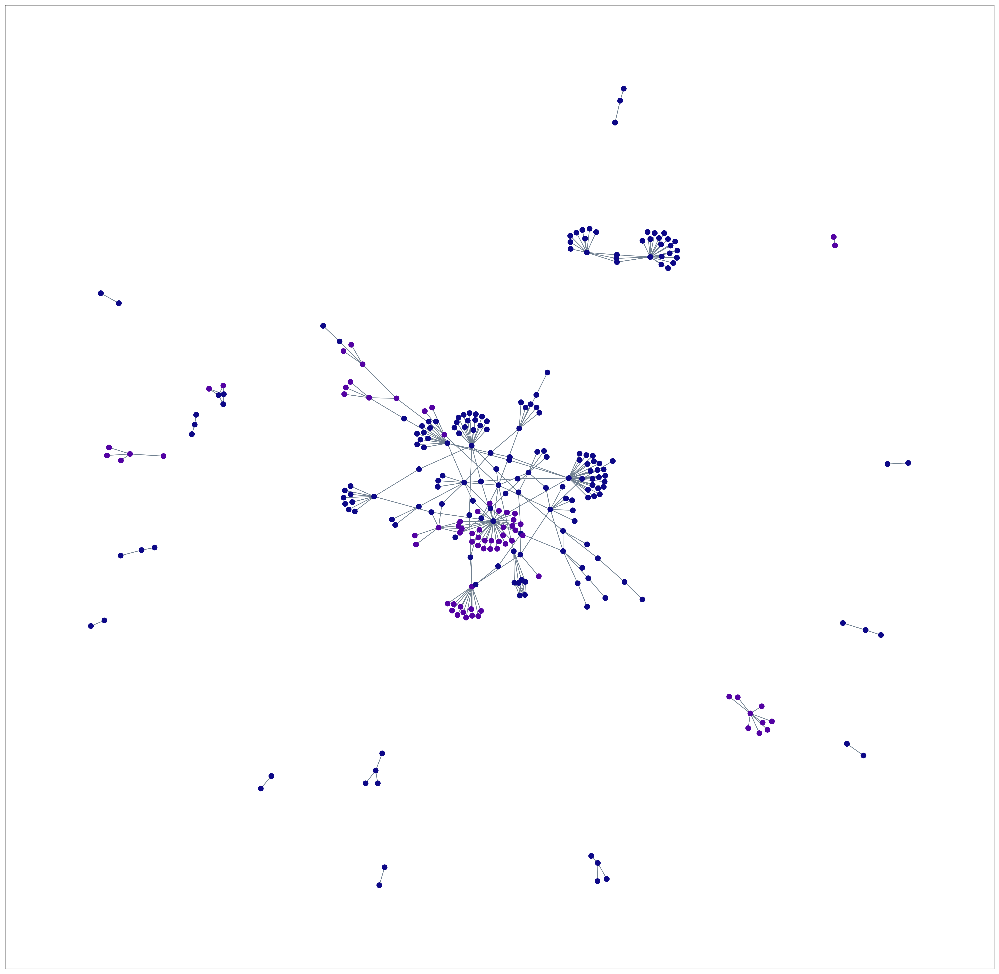

(9708, 45)
(8345, 45)
TLR4       19.0
APP        11.0
PRKD1      10.0
NOTCH3     10.0
DCC         8.0
GRIA1       7.0
SCN9A       5.0
ATM         5.0
GRIN2A      4.0
SCN2A       4.0
SCN1A       4.0
PLA2G6      4.0
CR1         2.0
CHRNB2      2.0
NEGR1       2.0
ACE         2.0
ESR2        2.0
STK39       2.0
TBK1        2.0
VRK2        1.0
UNC5C       1.0
TUBA4A      1.0
RTN4R       1.0
PSEN1       1.0
CILK1       1.0
ATP2A2      1.0
GRM5        1.0
CNTNAP2     1.0
ADCY2       1.0
AKT3        1.0
CNTN4       0.0
RELN        0.0
SNCA        0.0
APOE        0.0
SORL1       0.0
ANG         0.0
GAL         0.0
LRFN5       0.0
LGI1        0.0
MAPT        0.0
dtype: float64


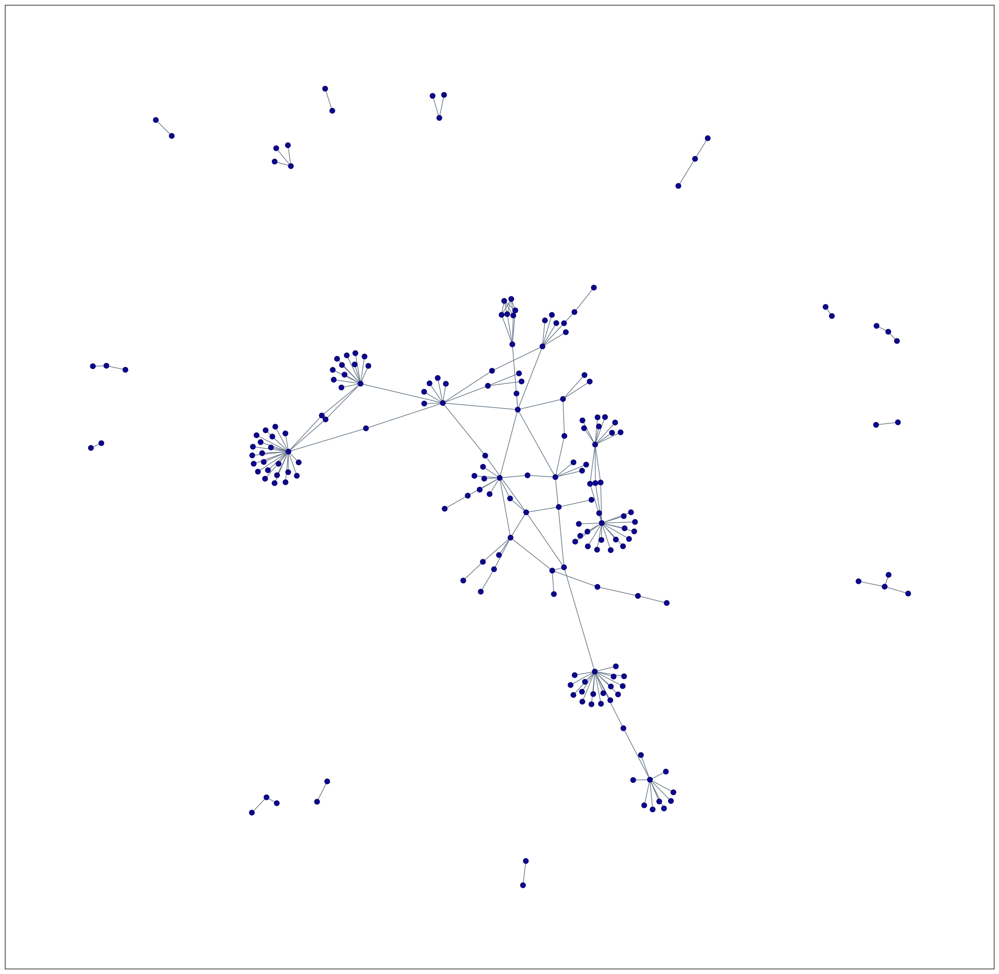

ValueError: Shape of passed values is (13, 1), indices imply (13, 13)

In [16]:
list_longest = []
for res in range(0,13):
    db = op.interactions.import_intercell_network(transmitter_params = {"categories":"ligand"}, receiver_params = {"categories": "receptor"})
    print(np.shape(db))
    db = db[np.logical_not(db['genesymbol_intercell_source'].str.startswith('HLA'))]
    db = db[np.logical_not(db['genesymbol_intercell_target'].str.startswith('HLA'))]
    db = db[~db['genesymbol_intercell_target'].astype(str).str.startswith('COMPLEX')]
    db = db[~db['genesymbol_intercell_source'].astype(str).str.startswith('COMPLEX')]
    print(np.shape(db))
    tgts_all = pd.read_csv(path[res])
    tgts_all['gene']=tgts_all['genes']
    tgts = tgts_all.drop(columns=['genes']).set_index(['gene'])

    source, percSrc, targets, percTgt, sum = ml.lr.find_hits(tgts, db)

    LRs = db[['genesymbol_intercell_source','genesymbol_intercell_target']][(db['genesymbol_intercell_source'].isin(list(sum.gene))) | (db['genesymbol_intercell_target'].isin(list(sum.gene)))]
    unique_genes = np.unique(list(LRs['genesymbol_intercell_source'])+list(LRs['genesymbol_intercell_target']))

    #comparison['number of LRs'].iloc[res] = len(unique_genes)

    # Adjacency matrix with entire network across all diseases
    adj_LRs = pd.DataFrame(np.zeros(shape=(len(unique_genes), len(unique_genes))), index = unique_genes, columns = unique_genes)

    for n in range (0, np.shape(LRs)[0]):
        adj_LRs.iloc[adj_LRs.index.get_loc(LRs.iloc[n]['genesymbol_intercell_source']), adj_LRs.columns.get_loc(LRs.iloc[n]['genesymbol_intercell_target'])] += 1

    #Number of cell-cell interactions ligands of interest are involved in
    print(adj_LRs.sum(axis = 0).sort_values(ascending=False)[adj_LRs.sum(axis = 0).sort_values(ascending=False).index.isin(list(tgts.index))])

    #Number of cell-cell interactions receptors of interest are involved in
    adj_LRs.sum(axis = 1).sort_values(ascending=False)[adj_LRs.sum(axis = 1).sort_values(ascending=False).index.isin(list(tgts.index))]

    # Overview of LR network and calculating rank of importance with PageRank

    H = nx.from_pandas_adjacency(adj_LRs)
    comms = ml.network.louvain_communities(H, seed = 123, resolution = 0.01)

    # Check which is the largest network and save % of total LRs in network
    for l in range(0,len(comms)):
        this = len(comms[l])
                    
        if (l == 0):
            longest = this
            cluster = comms[l]
        elif (this > longest):
            longest = this
            cluster = comms[l]
                    
    list_longest.append(longest/len(H))
    plt.figure(figsize=(25,25), dpi = 300)
    pos = nx.spring_layout(H)
    nx.draw_networkx_nodes(H, pos, node_color=df.loc[unique_genes].sum(axis = 1), node_size = 50, vmin=6, cmap = 'plasma_r')
    nx.draw_networkx_edges(H, pos, edge_color='slategrey')
    plt.savefig("plots/03-LR_network_visualisation/03l_visualise_networks/occurances_across_thresholds_max07_%s.png" % path[res].split('_')[2].split('.csv')[0], dpi = 300)
    plt.show()
pd.DataFrame(np.asarray(list_longest).reshape(-1,1), columns=df.columns)

In [19]:
pd.DataFrame(np.asarray(list_longest).reshape(1,-1), columns=df.columns).to_csv('processed_data/03-LR_network_visualisation/03l_visualise_networks/%_genes_in_major_network.csv')